# Random Forest Model for Loan Default Predictions

First, we import all our packages and read in the csv file. 

In [179]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib
import plotly.express as px
import os

In [180]:
loan_df = pd.read_csv("Loan_default.csv")

In [181]:
loan_df

,LoanID,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner,Default
0,I38PQUQS96,56,85994,50587,520,80,4,15.23,36,0.44,Bachelor's,Full-time,Divorced,Yes,Yes,Other,Yes,0
1,HPSK72WA7R,69,50432,124440,458,15,1,4.81,60,0.68,Master's,Full-time,Married,No,No,Other,Yes,0
2,C1OZ6DPJ8Y,46,84208,129188,451,26,3,21.17,24,0.31,Master's,Unemployed,Divorced,Yes,Yes,Auto,No,1
3,V2KKSFM3UN,32,31713,44799,743,0,3,7.07,24,0.23,High School,Full-time,Married,No,No,Business,No,0
4,EY08JDHTZP,60,20437,9139,633,8,4,6.51,48,0.73,Bachelor's,Unemployed,Divorced,No,Yes,Auto,No,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
255342,8C6S86ESGC,19,37979,210682,541,109,4,14.11,12,0.85,Bachelor's,Full-time,Married,No,No,Other,No,0
255343,98R4KDHNND,32,51953,189899,511,14,2,11.55,24,0.21,High School,Part-time,Divorced,No,No,Home,No,1
255344,XQK1UUUNGP,56,84820,208294,597,70,3,5.29,60,0.50,High School,Self-employed,Married,Yes,Yes,Auto,Yes,0
255345,JAO28CPL4H,42,85109,60575,809,40,1,20.90,48,0.44,High School,Part-time,Single,Yes,Yes,Other,No,0


## Exploratory Data Analysis

In [182]:
loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 255347 entries, 0 to 255346
Data columns (total 18 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   LoanID          255347 non-null  object 
 1   Age             255347 non-null  int64  
 2   Income          255347 non-null  int64  
 3   LoanAmount      255347 non-null  int64  
 4   CreditScore     255347 non-null  int64  
 5   MonthsEmployed  255347 non-null  int64  
 6   NumCreditLines  255347 non-null  int64  
 7   InterestRate    255347 non-null  float64
 8   LoanTerm        255347 non-null  int64  
 9   DTIRatio        255347 non-null  float64
 10  Education       255347 non-null  object 
 11  EmploymentType  255347 non-null  object 
 12  MaritalStatus   255347 non-null  object 
 13  HasMortgage     255347 non-null  object 
 14  HasDependents   255347 non-null  object 
 15  LoanPurpose     255347 non-null  object 
 16  HasCoSigner     255347 non-null  object 
 17  Default   

From the above code we see that there are no null values that we must adjust for.

In [183]:
loan_df.describe()

,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Default
count,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000,255347.000000
mean,43.498306,82499.304597,127578.865512,574.264346,59.541976,2.501036,13.492773,36.025894,0.500212,0.116128
std,14.990258,38963.013729,70840.706142,158.903867,34.643376,1.117018,6.636443,16.969330,0.230917,0.320379
min,18.000000,15000.000000,5000.000000,300.000000,0.000000,1.000000,2.000000,12.000000,0.100000,0.000000
25%,31.000000,48825.500000,66156.000000,437.000000,30.000000,2.000000,7.770000,24.000000,0.300000,0.000000
50%,43.000000,82466.000000,127556.000000,574.000000,60.000000,2.000000,13.460000,36.000000,0.500000,0.000000
75%,56.000000,116219.000000,188985.000000,712.000000,90.000000,3.000000,19.250000,48.000000,0.700000,0.000000
max,69.000000,149999.000000,249999.000000,849.000000,119.000000,4.000000,25.000000,60.000000,0.900000,1.000000


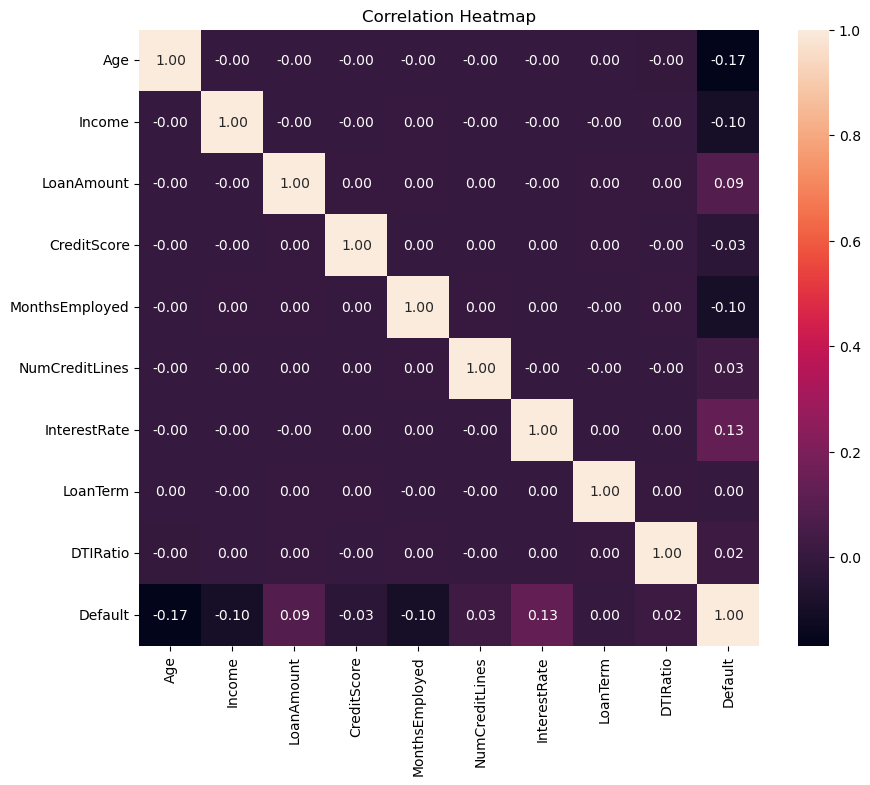

In [184]:
numeric_cols = loan_df.select_dtypes(include=np.number).columns.tolist()
correlation_matrix = loan_df[numeric_cols].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Heatmap')
plt.show()

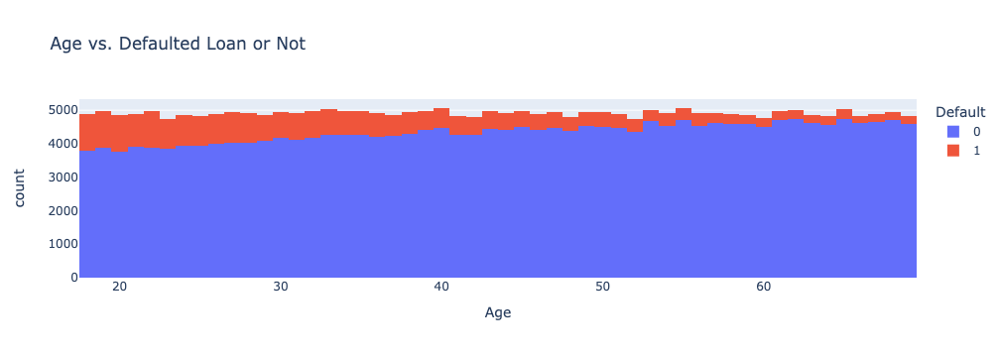

In [185]:
px.histogram(loan_df, x='Age', title='Age vs. Defaulted Loan or Not', color='Default')

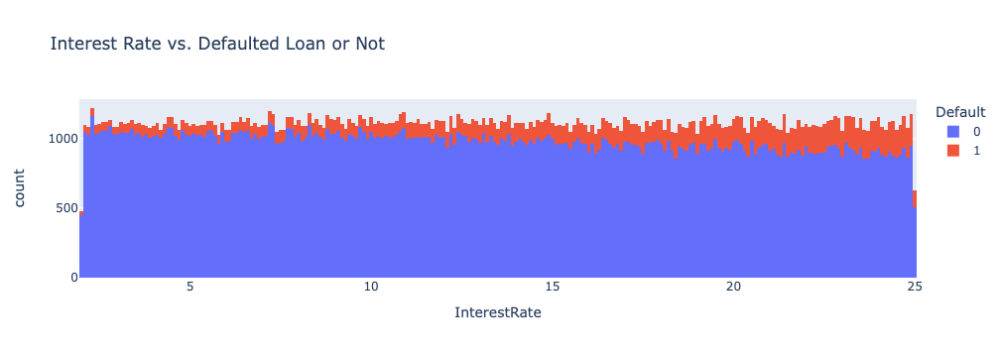

In [186]:
px.histogram(loan_df, x='InterestRate', title='Interest Rate vs. Defaulted Loan or Not', color='Default')

Looking at these histograms we see trends confirming our findings in the correlation matrix. Interest rate and age seem to be affecting the proportion of loans defaulted. We can observe that higher interest rates and younger ages are more likely to default their loans. 

In [187]:
# Create Training, Validation, and Test Sets
from sklearn.model_selection import train_test_split

In [188]:
train_df, test_val_df = train_test_split(loan_df, test_size=0.2, random_state=42)

In [189]:
train_df.shape

(204277, 18)

In [190]:
test_val_df.shape

(51070, 18)

In [191]:
test_df, val_df = train_test_split(test_val_df, test_size=0.5, random_state=42)

In [192]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (204277, 18)
val_df.shape : (25535, 18)
test_df.shape : (25535, 18)


Now, we must remove the LoanID column because it is irrelevant for prediction purposes. We must also drop Default because that is the value we are predicting. 

In [193]:
train_targets = train_df["Default"]
val_targets = val_df["Default"]
test_targets = test_df["Default"]

In [194]:
train_df = train_df.drop(columns=["LoanID", "Default"])

In [195]:
val_df = val_df.drop(columns=["LoanID", "Default"])

In [196]:
test_df = test_df.drop(columns=["LoanID", "Default"])

In [197]:
train_df

,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner
137187,18,137576,209136,846,26,2,10.47,60,0.81,High School,Self-employed,Single,Yes,No,Business,No
230334,47,57194,5970,748,30,2,19.72,36,0.73,High School,Unemployed,Divorced,No,Yes,Education,No
19687,26,84328,95065,453,7,2,24.25,12,0.45,Master's,Self-employed,Married,No,No,Other,Yes
106509,53,49795,229582,533,107,3,14.44,60,0.17,Bachelor's,Self-employed,Single,Yes,No,Auto,Yes
242291,49,115450,22072,840,0,4,24.48,12,0.11,Bachelor's,Part-time,Single,No,Yes,Education,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119879,40,116623,161673,651,79,2,23.44,12,0.87,Bachelor's,Part-time,Divorced,No,No,Home,Yes
103694,67,62958,189499,460,77,3,9.29,36,0.11,Bachelor's,Self-employed,Single,No,No,Business,Yes
131932,62,34372,59645,524,94,3,9.72,60,0.24,PhD,Full-time,Single,Yes,No,Auto,No
146867,44,146262,198454,489,7,4,4.31,48,0.30,High School,Self-employed,Married,Yes,No,Home,No


Random Forest Classifier needs all the values to be numbers so we must change the categorical variables into numerical variables. 

In [198]:
mapping = {'No': 0, 'Yes': 1}

train_df['HasMortgage'] = train_df['HasMortgage'].map(mapping)
train_df['HasDependents'] = train_df['HasDependents'].map(mapping)
train_df['HasCoSigner'] = train_df['HasCoSigner'].map(mapping)
val_df['HasMortgage'] = val_df['HasMortgage'].map(mapping)
val_df['HasDependents'] = val_df['HasDependents'].map(mapping)
val_df['HasCoSigner'] = val_df['HasCoSigner'].map(mapping)
test_df['HasMortgage'] = test_df['HasMortgage'].map(mapping)
test_df['HasDependents'] = test_df['HasDependents'].map(mapping)
test_df['HasCoSigner'] = test_df['HasCoSigner'].map(mapping)

In [199]:
train_df

,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner
137187,18,137576,209136,846,26,2,10.47,60,0.81,High School,Self-employed,Single,1,0,Business,0
230334,47,57194,5970,748,30,2,19.72,36,0.73,High School,Unemployed,Divorced,0,1,Education,0
19687,26,84328,95065,453,7,2,24.25,12,0.45,Master's,Self-employed,Married,0,0,Other,1
106509,53,49795,229582,533,107,3,14.44,60,0.17,Bachelor's,Self-employed,Single,1,0,Auto,1
242291,49,115450,22072,840,0,4,24.48,12,0.11,Bachelor's,Part-time,Single,0,1,Education,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119879,40,116623,161673,651,79,2,23.44,12,0.87,Bachelor's,Part-time,Divorced,0,0,Home,1
103694,67,62958,189499,460,77,3,9.29,36,0.11,Bachelor's,Self-employed,Single,0,0,Business,1
131932,62,34372,59645,524,94,3,9.72,60,0.24,PhD,Full-time,Single,1,0,Auto,0
146867,44,146262,198454,489,7,4,4.31,48,0.30,High School,Self-employed,Married,1,0,Home,0


We will be using one-hot encoding for the remaining categorical variables. 

In [200]:
train_df = pd.get_dummies(train_df, dtype=int)
val_df = pd.get_dummies(val_df, dtype=int)
test_df = pd.get_dummies(test_df, dtype=int)

In [201]:
train_df

,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,HasMortgage,...,EmploymentType_Self-employed,EmploymentType_Unemployed,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,LoanPurpose_Auto,LoanPurpose_Business,LoanPurpose_Education,LoanPurpose_Home,LoanPurpose_Other
137187,18,137576,209136,846,26,2,10.47,60,0.81,1,...,1,0,0,0,1,0,1,0,0,0
230334,47,57194,5970,748,30,2,19.72,36,0.73,0,...,0,1,1,0,0,0,0,1,0,0
19687,26,84328,95065,453,7,2,24.25,12,0.45,0,...,1,0,0,1,0,0,0,0,0,1
106509,53,49795,229582,533,107,3,14.44,60,0.17,1,...,1,0,0,0,1,1,0,0,0,0
242291,49,115450,22072,840,0,4,24.48,12,0.11,0,...,0,0,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119879,40,116623,161673,651,79,2,23.44,12,0.87,0,...,0,0,1,0,0,0,0,0,1,0
103694,67,62958,189499,460,77,3,9.29,36,0.11,0,...,1,0,0,0,1,0,1,0,0,0
131932,62,34372,59645,524,94,3,9.72,60,0.24,1,...,0,0,0,0,1,1,0,0,0,0
146867,44,146262,198454,489,7,4,4.31,48,0.30,1,...,1,0,0,1,0,0,0,0,1,0


In order to prepare the dataset we normalize the data.

In [171]:
from sklearn.preprocessing import MinMaxScaler

In [202]:
loan_df_fit = loan_df
loan_df_fit = loan_df_fit.drop(columns=["LoanID", "Default"])
loan_df_fit['HasMortgage'] = loan_df_fit['HasMortgage'].map(mapping)
loan_df_fit['HasDependents'] = loan_df_fit['HasDependents'].map(mapping)
loan_df_fit['HasCoSigner'] = loan_df_fit['HasCoSigner'].map(mapping)
loan_df_fit = pd.get_dummies(loan_df_fit, dtype=int)
cols = loan_df_fit.columns
scaler = MinMaxScaler().fit(loan_df_fit)
train_df[cols] = scaler.transform(train_df[cols])
val_df[cols] = scaler.transform(val_df[cols])
test_df[cols] = scaler.transform(test_df[cols])

In [205]:
train_df.describe()

,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,HasMortgage,...,EmploymentType_Self-employed,EmploymentType_Unemployed,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,LoanPurpose_Auto,LoanPurpose_Business,LoanPurpose_Education,LoanPurpose_Home,LoanPurpose_Other
count,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000,...,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000,204277.000000
mean,0.499791,0.500050,0.500196,0.499227,0.500072,0.500693,0.499485,0.500228,0.500724,0.500032,...,0.249181,0.249632,0.333552,0.333944,0.332504,0.199391,0.200630,0.199998,0.200111,0.199871
std,0.294023,0.288536,0.289206,0.289394,0.291139,0.372299,0.288524,0.353017,0.288642,0.500001,...,0.432540,0.432801,0.471483,0.471621,0.471112,0.399544,0.400472,0.400000,0.400084,0.399904
min,0.000000,0.000000,0.000004,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.254902,0.250950,0.249221,0.249545,0.252101,0.333333,0.250435,0.250000,0.250000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.490196,0.499263,0.500422,0.499089,0.495798,0.666667,0.497826,0.500000,0.500000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.745098,0.749983,0.750383,0.750455,0.756303,1.000000,0.749565,0.750000,0.750000,1.000000,...,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


We have processed all the data, so we can start creating our random forest model. 

In [207]:
from sklearn.ensemble import RandomForestClassifier

In [208]:
model = RandomForestClassifier(n_jobs=-1, random_state=42)

In [209]:
model.fit(train_df, train_targets)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [210]:
base_train_acc = model.score(train_df, train_targets)
base_train_acc

0.9999853140588515

In [212]:
base_val_acc = model.score(val_df, val_targets)

In [214]:
base_val_acc

0.8460779322498531

Our base validation accuracy is 84.6% and our training accuracy is almost 100%. This is a case of overfitting, and the model is memorizing the training examples which is why its training accuracy is so high. In order to generalize the model we must fine tune it using various different hyperparameters. 

In [215]:
importance_df = pd.DataFrame({
    'feature': train_df.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)
importance_df

,feature,importance
1,Income,0.122686
6,InterestRate,0.116853
2,LoanAmount,0.110107
0,Age,0.099622
3,CreditScore,0.096313
4,MonthsEmployed,0.094674
8,DTIRatio,0.084893
7,LoanTerm,0.038914
5,NumCreditLines,0.030433
9,HasMortgage,0.013971


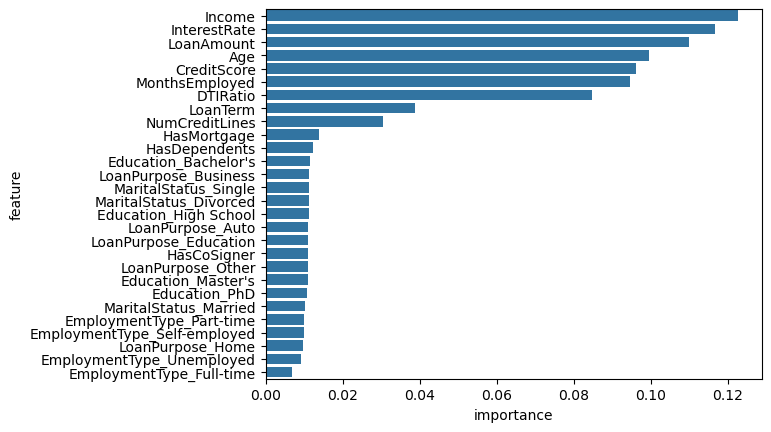

In [216]:
sns.barplot(data=importance_df, x='importance', y='feature');

The bar chart above shows us the important of each feature to create the decision trees in the random forest model. 

In [217]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}

# Set up the grid search
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the grid search
grid_search.fit(train_df, train_targets)

# Print the best parameters and the corresponding score
print("Best parameters found: ", grid_search.best_params_)
print("Best accuracy: ", grid_search.best_score_)

Best parameters found:  {'max_depth': 20, 'min_samples_split': 10, 'n_estimators': 200}
Best accuracy:  0.885527983013948


In [218]:
model = RandomForestClassifier(n_jobs=-1, random_state=42, bootstrap=False, n_estimators=200, max_depth=20, 
                               min_samples_split=10, max_features=7)
model.fit(train_df, train_targets)
model.score(train_df, train_targets), model.score(val_df, val_targets)

(0.9695511486853635, 0.8870178186802428)

In [219]:
test_acc = model.score(test_df, test_targets)
test_acc

0.8876835715684355

In [226]:
def predict_input(model, single_input):
    input_df = pd.DataFrame([single_input])
    input_df[cols] = scaler.transform(input_df[cols])
    pred = model.predict(input_df)[0]
    prob = model.predict_proba(input_df)[0][list(model.classes_).index(pred)]
    return pred, prob

In [227]:
input_values = {'Age': 24, 'Income': 74532, 'LoanAmount': 9123, 'CreditScore': 752, 'MonthsEmployed': 26,
       'NumCreditLines': 1, 'InterestRate': 7.82, 'LoanTerm': 12, 'DTIRatio': 0.22, 'HasMortgage': 1,
       'HasDependents': 0, 'HasCoSigner': 1, "Education_Bachelor's": 1,
       'Education_High School': 0, "Education_Master's": 0, 'Education_PhD': 0,
       'EmploymentType_Full-time': 1, 'EmploymentType_Part-time': 0,
       'EmploymentType_Self-employed': 0, 'EmploymentType_Unemployed': 0,
       'MaritalStatus_Divorced': 0, 'MaritalStatus_Married': 0,
       'MaritalStatus_Single': 1, 'LoanPurpose_Auto': 0, 'LoanPurpose_Business': 0,
       'LoanPurpose_Education': 0, 'LoanPurpose_Home': 0, 'LoanPurpose_Other': 1}

In [228]:
predict_input(model, input_values)

(0, 0.9434397451459737)

In [229]:
import joblib

joblib.dump(model, 'model.pkl')

['model.pkl']